# Data Preprocessing and Augmentation

**Data preprocessing involves transforming and cleaning the raw data** to make it more suitable for model training. This includes tasks like resizing the images to a consistent size, normalizing the pixel values, and handling missing or corrupted data. By preprocessing the data, we ensure that it is in a format that the model can effectively learn from.

**Data augmentation, on the other hand, involves applying various transformations to the existing data to create additional training samples**. This can include techniques like random cropping, rotation, flipping, or adjusting brightness and contrast. Data augmentation **helps to increase the diversity and variability of the training data**, allowing the model to learn from a wider range of scenarios and improve its ability to generalize to new, unseen data.

Both data preprocessing and augmentation play a crucial role in enhancing the performance and robustness of computer vision models. They help to **reduce overfitting** by introducing more variation in the training data and improve the model's ability to handle real-world variations and noise. Additionally, data preprocessing and augmentation enable the model to learn from a larger and more representative dataset, leading to **better generalization** and **improved accuracy on unseen images**.


In [1]:
import os

ROOT_DIR = os.path.dirname(os.path.abspath(''))
DATA_DIR = os.path.join(ROOT_DIR, 'data/food-101-tiny')

## Data Preprocessing

### Data Cleansing

In this project, we have curated the data we are using, which means we expect it to be clean and free of issues. However, **when we collect data from various sources**, it's important to recognize that **it may include problems like broken image files, incorrect labels, or heavily distorted images** for unknown reasons. That's why it is valuable to check the labels, values, and filter the data during the exploratory data analysis (EDA) process or manually examine the data source. This helps us identify and prevent the inclusion of low-quality data that could affect the accuracy and reliability of our project.

One tool that is useful to find data anomalies, duplicates, or label mistakes is [fiftyone-brain](https://docs.voxel51.com/user_guide/brain.html)

### Data Resizing

While we can resize the data during the augmentation process, it's often beneficial to resize the data before training. **It's crucial to have an understanding of the data size** before beginning the training process to maximize the number of training images used.

For example, if the dataset size is large, like 1000x1000, it can quickly consume a lot of memory even with just a few images or a small batch. However, if we reduce the size to half of its original dimensions, we can save 50% of the memory space. This allows us to accommodate more images and larger batches during training.

It's important to note that this step is optional and may not be suitable for every use case. The decision to resize the data before training depends on factors like available memory resources and specific project requirements.

## Data Augmentation

![albumentations-image-sample](https://albumentations.ai/docs/images/getting_started/augmenting_images/augmentation_pipeline_visualized.jpg)

There are a lot of available libraries for image data augmentation, even accelerated with gpu, such as:
- [torchvision](https://pytorch.org/vision/stable/index.html)
- [Albumentations](albumentations.ai)
- [imgaug](https://github.com/aleju/imgaug)
- [DALI](https://developer.nvidia.com/dali)
- [kornia](https://github.com/kornia/kornia)
- [MONAI](https://monai.io/)

For the sake of simplicity, we're going to use **torchvision** augmentation pipeline and policies. In the future, we might also have to use domain-specific augmentation such as *MONAI* or implement it manually for specific use cases.

### Helper Functions

In [2]:
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

class_names = [
    'apple_pie',
    'bibimbap',
    'cannoli',
    'edamame',
    'falafel',
    'french_toast',
    'ice_cream',
    'ramen',
    'sushi',
    'tiramisu'
]

train_data_path = os.path.join(DATA_DIR, 'train')
train_split_images_path = []

for name in class_names:
    list_files = os.listdir(os.path.join(train_data_path, name))
    list_files = [os.path.join(train_data_path, name, file) for file in list_files]
    train_split_images_path+=list_files

random.shuffle(train_split_images_path)
train_split_images_path = random.choices(train_split_images_path, k=20)

def visualize(image):
    shape = image.shape
    if shape[-1] != 3:
        image = np.transpose(image, (1, 2, 0))
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)

### Display Image

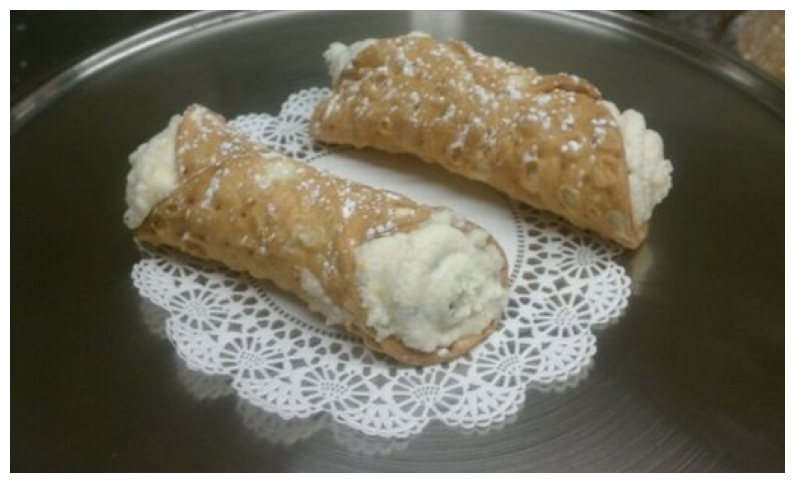

In [3]:
image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
visualize(image)

### Simple Augmentation

Let's try to use a simple augmentation to see how augmentation works.

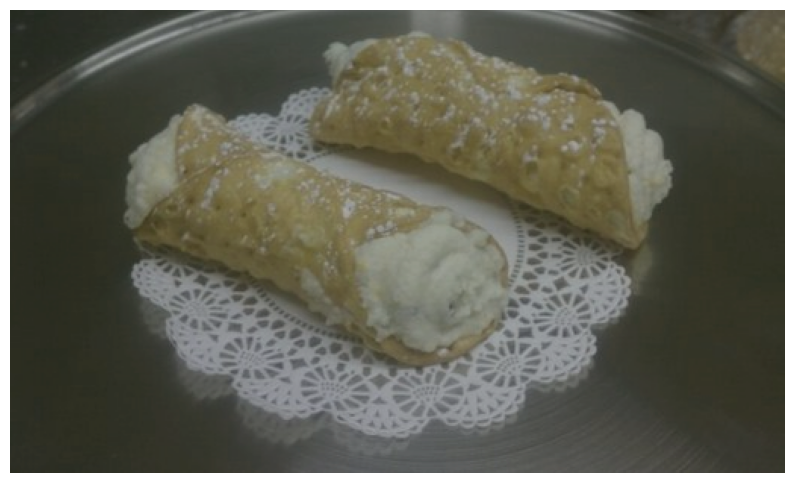

In [4]:
transformation = transforms.ColorJitter(0.3, 0.5, 0.02, 0.4)
image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = torch.from_numpy(image).permute((2,0,1))
image_pt = transformation(image_pt)
visualize(image_pt.numpy())

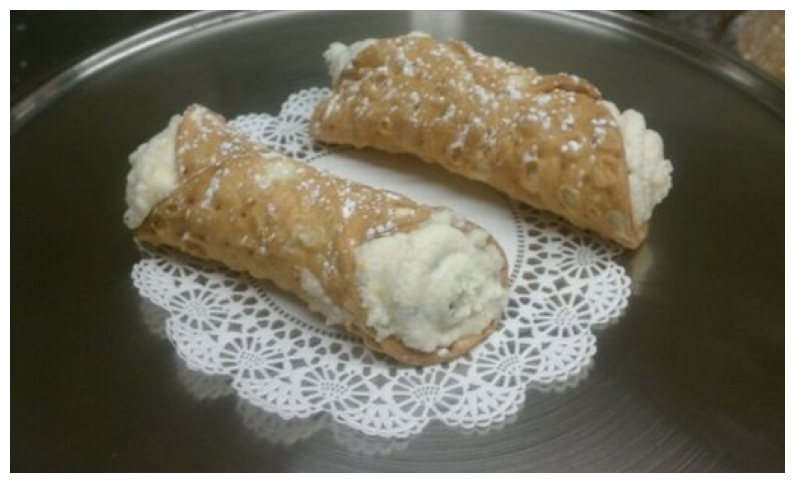

In [5]:
transformation = transforms.RandomSolarize(0.3)
image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = torch.from_numpy(image).permute((2,0,1))
image_pt = transformation(image_pt)
visualize(image_pt.numpy())

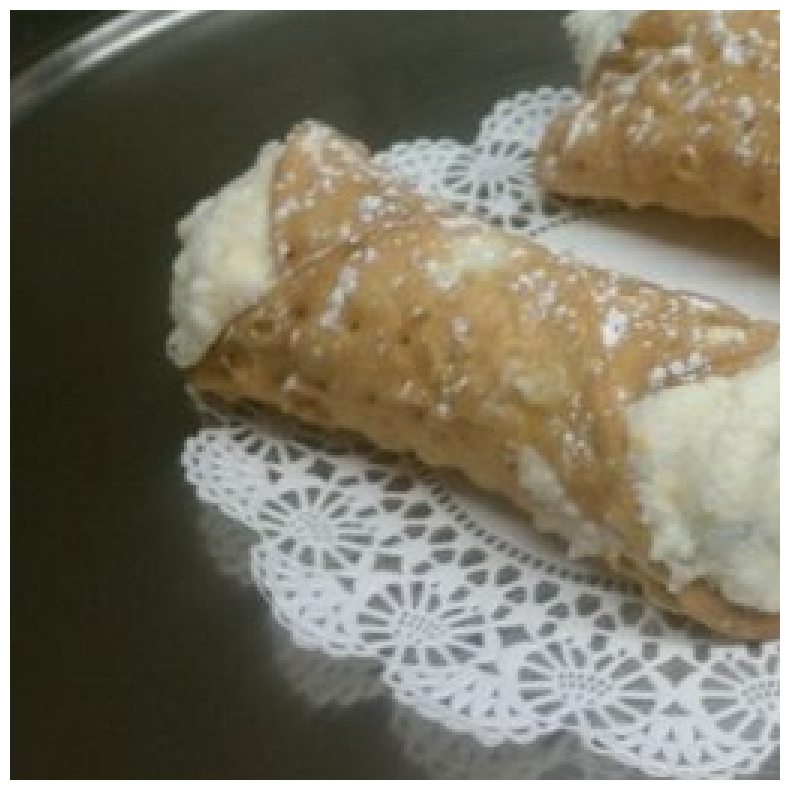

In [6]:
transformation = transforms.RandomCrop((256, 256))
image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = torch.from_numpy(image).permute((2,0,1))
image_pt = transformation(image_pt)
visualize(image_pt.numpy())

### Chained Augmentation

With torchvision transformations, we can combine different augmentation techniques together in a single pipeline. This is helpful for creating a series of changes to the data, making it more diverse and varied. By chaining multiple augmentations, we can construct a complex augmentation pipeline that enhances the variety of samples in our dataset.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


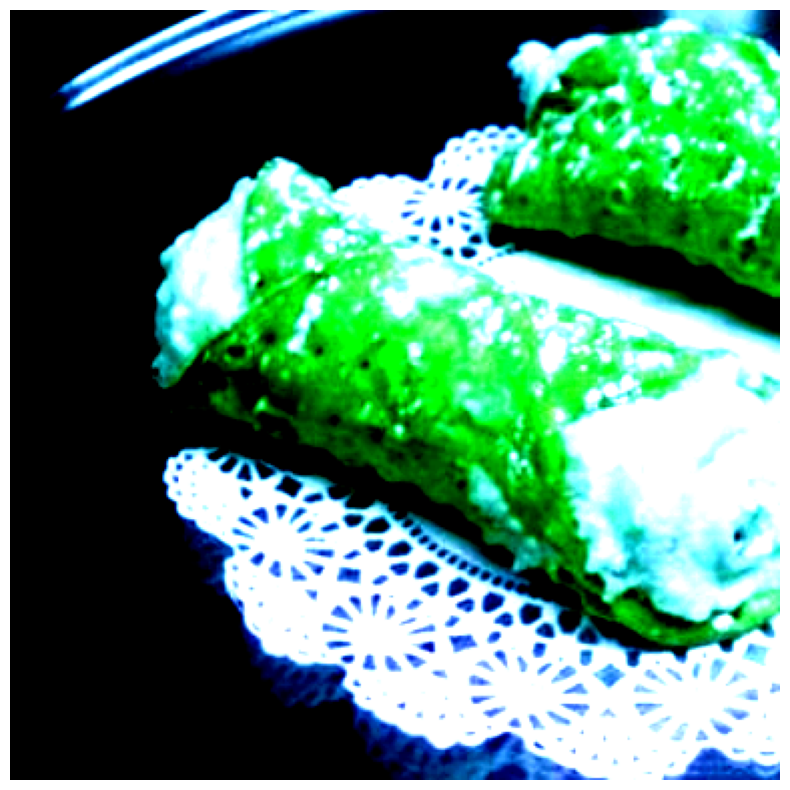

In [13]:
transformations = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomResizedCrop(384),
    transforms.ColorJitter(0.3, 0.5, 0.02, 0.4),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.51442681, 0.43435301, 0.33421855], std=[0.24099932, 0.246478, 0.23652802])
])

image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = transformations(image)
visualize(image_pt.numpy())


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


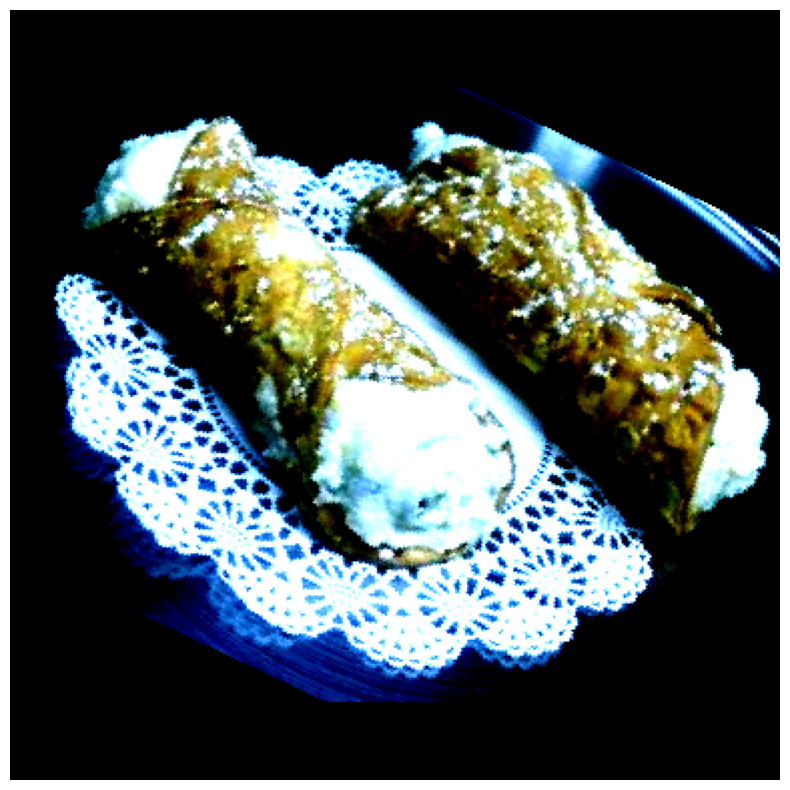

In [22]:
transformations = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(60),
    transforms.RandomChoice([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
    ]),
    transforms.CenterCrop(384),
    transforms.RandomChoice([
        transforms.ColorJitter(0.3, 0.5, 0.02, 0.4),
        transforms.RandomPosterize(3),
    ]),
    transforms.RandomChoice([
        transforms.RandomEqualize(),
        transforms.RandomAutocontrast(),
    ]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.51442681, 0.43435301, 0.33421855], std=[0.24099932, 0.246478, 0.23652802])
])

image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = transformations(image)
visualize(image_pt.numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

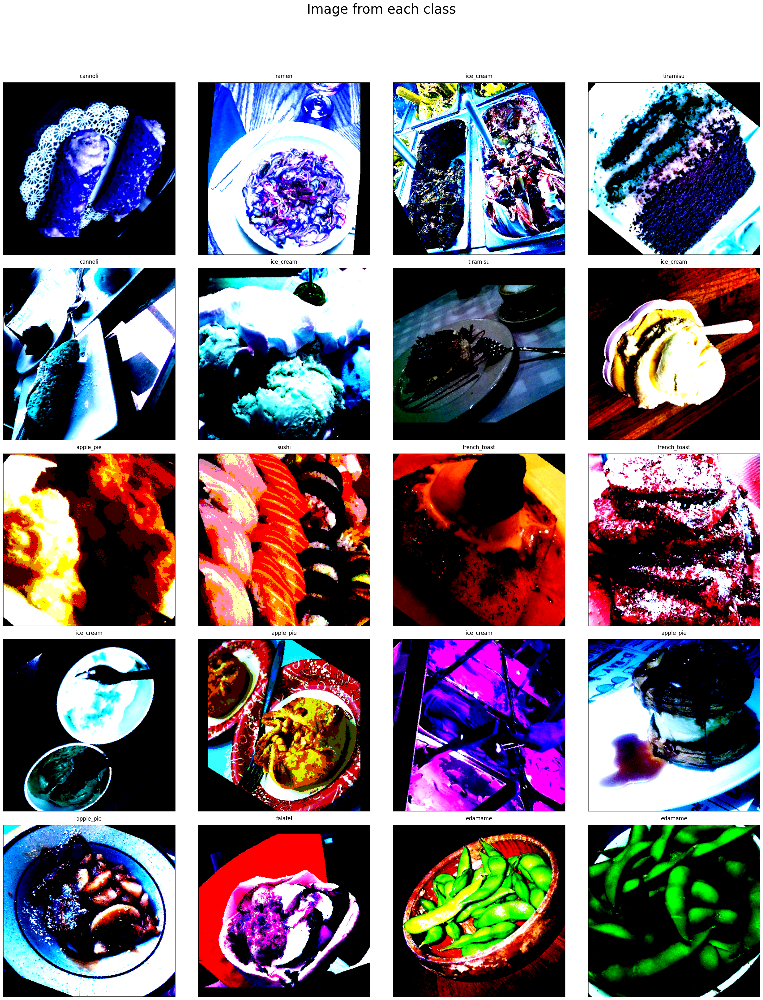

In [25]:
rows = 5
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(25,30))
axs = axs.ravel().tolist()

for idx, file_path in enumerate(train_split_images_path):
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = transformations(image).numpy()
    image = np.transpose(image, (1, 2, 0))
    class_name = file_path.split('/')[-2]
    axs[idx].imshow(image)
    axs[idx].set_title(class_name, pad = 10)

fig.suptitle("Image from each class", y=1.05, fontsize=30)
plt.setp(axs, xticks=[],yticks=[])
plt.tight_layout()

### Auto-Augmentation Policies

There are a lot of popular automated or pre-defined augmentation policies such as:
- [AutoAugemnt](https://pytorch.org/vision/stable/generated/torchvision.transforms.AutoAugment.html#torchvision.transforms.AutoAugment)
- [RandAugment](https://pytorch.org/vision/stable/generated/torchvision.transforms.RandAugment.html#torchvision.transforms.RandAugment)
- [AugMix](https://pytorch.org/vision/stable/generated/torchvision.transforms.AugMix.html#torchvision.transforms.AugMix)
- [TrivialAugment](https://pytorch.org/vision/stable/generated/torchvision.transforms.TrivialAugmentWide.html#torchvision.transforms.TrivialAugmentWide)

You may choose any kind of augmentation polices as long as you understand the process and its effect on the image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

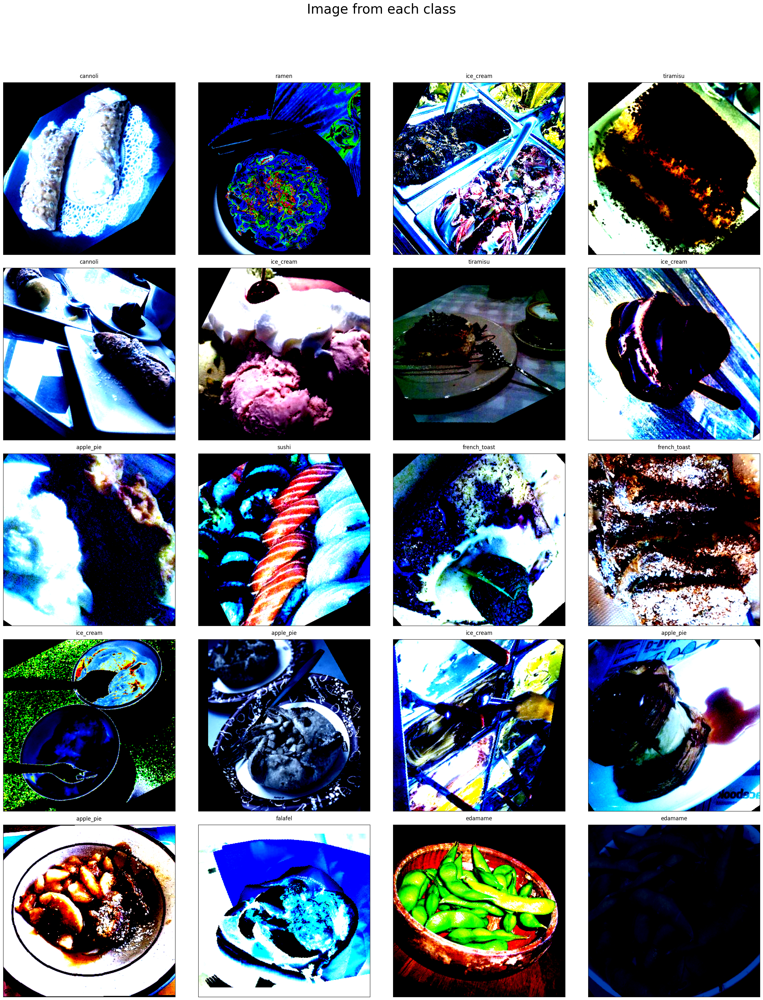

In [29]:
transformations = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(60),
    transforms.RandomChoice([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
    ]),
    transforms.CenterCrop(384),
    transforms.AutoAugment(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.51442681, 0.43435301, 0.33421855], std=[0.24099932, 0.246478, 0.23652802])
])

rows = 5
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(25,30))
axs = axs.ravel().tolist()

for idx, file_path in enumerate(train_split_images_path):
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = transformations(image).numpy()
    image = np.transpose(image, (1, 2, 0))
    class_name = file_path.split('/')[-2]
    axs[idx].imshow(image)
    axs[idx].set_title(class_name, pad = 10)

fig.suptitle("Image from each class", y=1.05, fontsize=30)
plt.setp(axs, xticks=[],yticks=[])
plt.tight_layout()

## (NOTE) Rotation - Translation - Flip

When combining rotation, translation, and flip for image transformations, it's important to **be cautious as it can inadvertently remove important image-level information**. The order in which these transformations are applied matters. For instance, applying translation followed by rotation is different from rotation followed by translation. If the image is not centered, adding a flip may shift the image outside its original position and potentially introduce paddings to compensate for the shift. Therefore, careful consideration is needed to ensure that the desired transformations preserve the integrity and meaningfulness of the image data.

### Rotation + Translation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


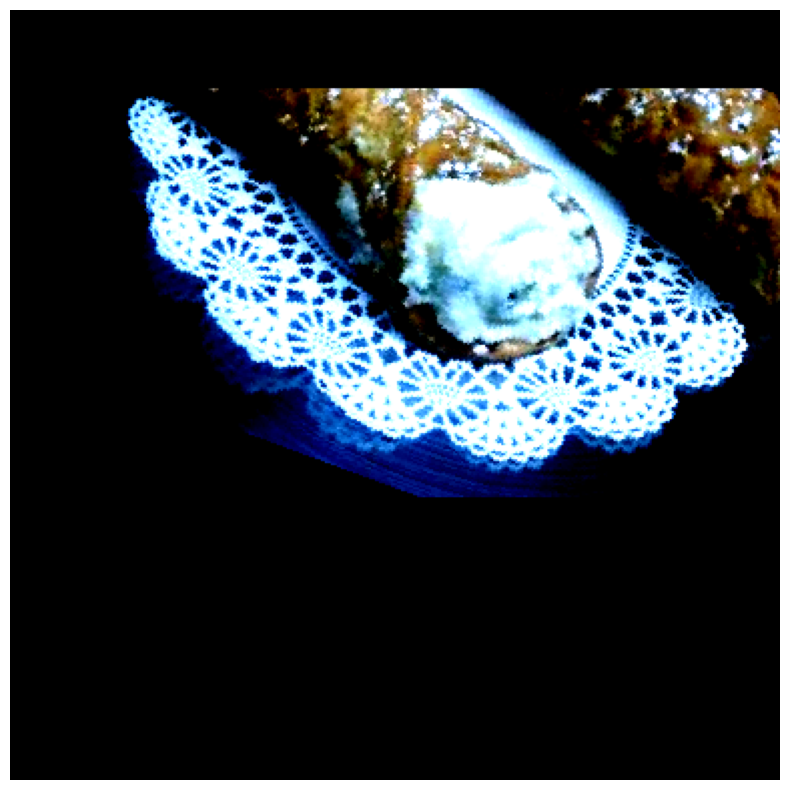

In [33]:
transformations = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(60),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.5)),
    transforms.CenterCrop(384),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.51442681, 0.43435301, 0.33421855], std=[0.24099932, 0.246478, 0.23652802])
])

image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = transformations(image)
visualize(image_pt.numpy())

### Translation + Rotation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


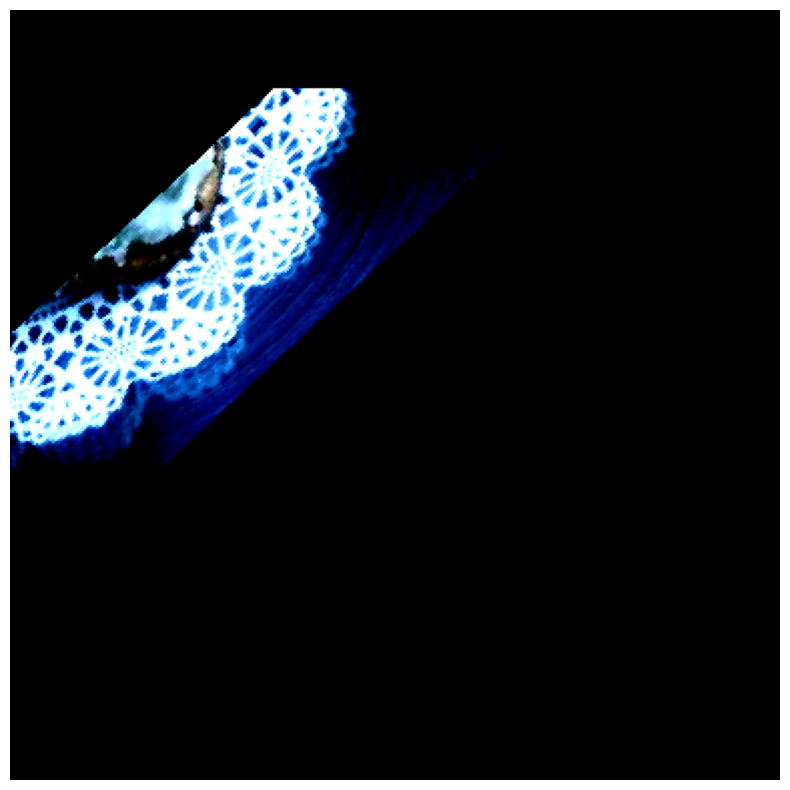

In [38]:
transformations = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.8)),
    transforms.RandomRotation(60),
    transforms.CenterCrop(384),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.51442681, 0.43435301, 0.33421855], std=[0.24099932, 0.246478, 0.23652802])
])

image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = transformations(image)
visualize(image_pt.numpy())

### Translation + Rotation + Flipping

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


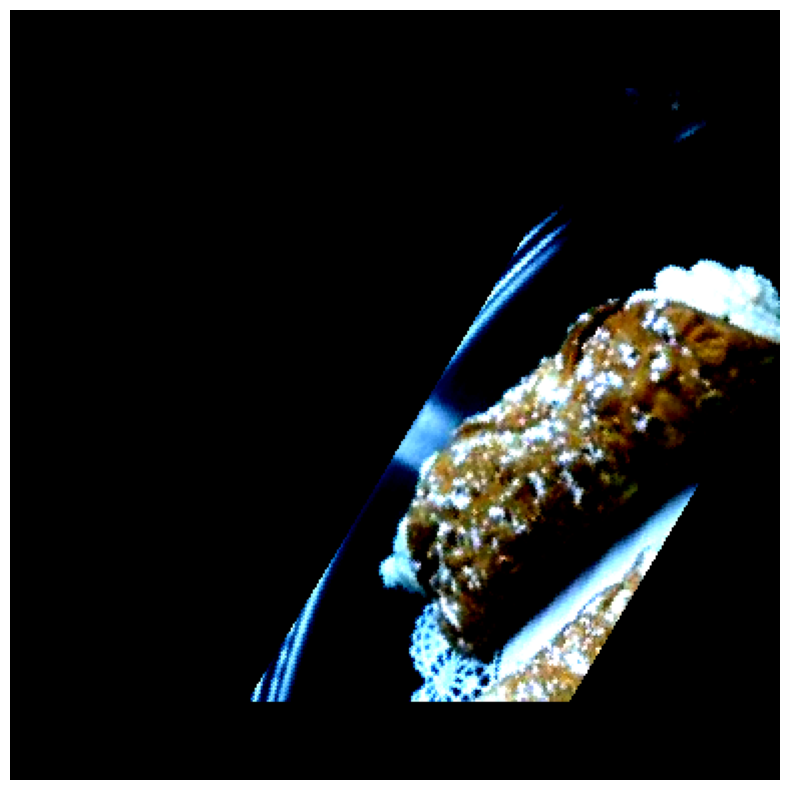

In [39]:
transformations = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.8)),
    transforms.RandomRotation(60),
        transforms.RandomChoice([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
    ]),
    transforms.CenterCrop(384),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.51442681, 0.43435301, 0.33421855], std=[0.24099932, 0.246478, 0.23652802])
])

image = cv2.imread(train_split_images_path[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_pt = transformations(image)
visualize(image_pt.numpy())